In [1]:
import scipy.io as scio 
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.cbook as cbook
from sklearn.cluster import KMeans
import spectral as sp
import numpy as np
import glob
import os 
from sklearn.cluster import KMeans
import skimage as ski
# import skfuzzy as skf

In [2]:
def PartialError(g, s):
    """Patial Error function."""
    
    clust_g = np.unique(g)
    clust_s = np.unique(s)
    err = 0.0

    for j in clust_g:
        # initializing inner summation is the formaula.
        inner = 0.0
        
        Aj = (g == j)
        Wj = 0.0
        Wj += np.sum(Aj,dtype=np.float_)/(g.size)
        
        # calculating denominator for Wji
        Wji_den = np.sum([(np.sum(np.logical_and(Aj, s == x))!=0) * np.sum(s == x) for x in clust_s],
                         dtype=np.float_)
        
        # calculating inner summation
        for i in clust_s:
            # Wji
            Bi = ( s == i )
            Wji = ((np.sum(np.logical_and(Aj,Bi),dtype=np.float_)!=0) * np.sum(Bi)) / Wji_den

            inner += (np.sum(np.logical_and(Aj,Bi),dtype=np.float_) / 
                      np.sum(np.logical_or(Aj,Bi),dtype=np.float_))*Wji

            
        # calculating outer summation
        err += (1-inner)*Wj

    return err

In [3]:
def MyMartinIndex7(gtImage, sImage):
    """Object-level Consistency Error Martin Index."""
    clust_gtImage = np.unique(gtImage)
    clust_sImage = np.unique(sImage)
    score = np.min([PartialError(gtImage, sImage), PartialError(sImage, gtImage)])
    return score 

In [4]:

gt = np.array([[1, 1, 1, 1],
               [1, 1, 1, 1],
               [1, 1, 1, 1],
               [1, 1, 1, 1]])

im1=np.array([ [1, 1, 1, 1],
               [1, 1, 1, 1],
               [1, 1, 1, 1],
               [1, 1, 1, 1]])

im2=np.array([ [1, 1, 2, 2],
               [1, 1, 2, 2],
               [1, 1, 2, 2],
               [1, 1, 2, 2]])

im3=np.array([ [1, 1, 2, 2],
               [1, 1, 2, 2],
               [1, 1, 3, 3],
               [1, 1, 3, 3]])
im4=np.zeros((4,4), dtype=np.int16)

# Test 1: Perfect match
assert MyMartinIndex7(gt,im1)==0

# Test 2: Terrible match
assert MyMartinIndex7(gt,im4)==0

# Test 3: Example 1
assert MyMartinIndex7(gt,im2)==0.5

# Test 4: Example 2
assert MyMartinIndex7(gt,im3)==0.625

print("All Tests ran sucessfully.")

All Tests ran sucessfully.


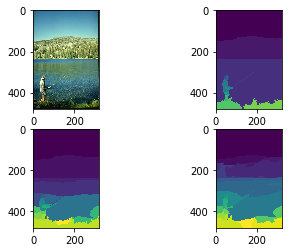

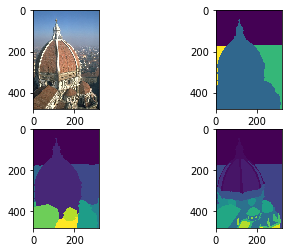

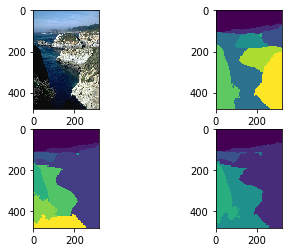

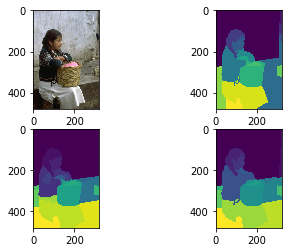

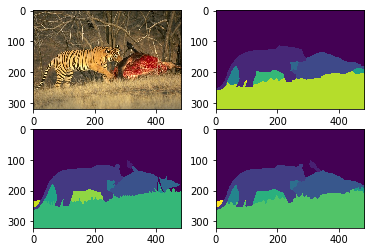

...

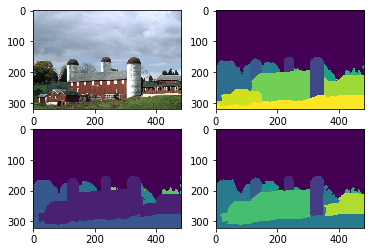

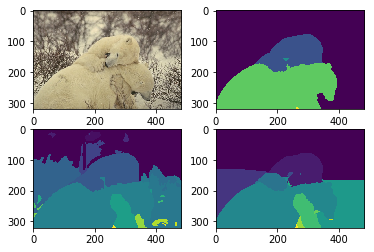

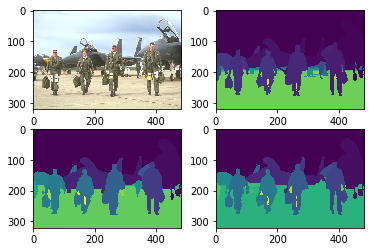

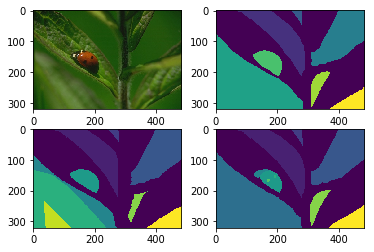

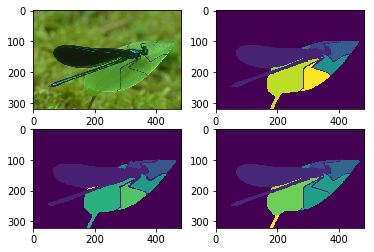

In [20]:
# # %load checkEm.py
# for mat_file in glob.glob('ImsAndSegs/*.mat'):
#     img = scio.loadmat(mat_file)
#     plt.figure(mat_file.split(os.sep)[1].replace('.mat',''))
#     plt.subplot(2,2,1)
#     plt.imshow(img['Im'])
#     plt.subplot(2,2,2)
#     plt.imshow(img['Seg1'])
#     plt.subplot(2,2,3)
#     plt.imshow(img['Seg2'])
#     plt.subplot(2,2,4)
#     plt.imshow(img['Seg3'])
#     plt.show()


In [27]:
a = np.array([ [1, 1, 1, 1],
               [1, 2, 2, 1],
               [1, 1, 2, 1],
               [1, 1, 2, 2]])

# print (a == 1)
# print (np.unique(a))
# scores = []
# # np.append(scores, [1])
# scores.append(1)
# scores.append(2)
# print(np.mean(scores))

for mat_file in glob.glob('ImsAndSegs/*.mat'):
    img = scio.loadmat(mat_file)
print(img)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Sat Mar 17 11:00:09 2018', '__version__': '1.0', '__globals__': [], 'Im': array([[[ 27,  48,   9],
        [ 33,  55,   8],
        [ 34,  60,   0],
        ..., 
        [116, 140,  52],
        [114, 140,  51],
        [115, 141,  52]],

       [[ 31,  52,   9],
        [ 31,  54,   2],
        [ 51,  78,  11],
        ..., 
        [114, 138,  50],
        [113, 137,  49],
        [113, 139,  50]],

       [[ 25,  49,   0],
        [ 38,  63,   5],
        [ 82, 110,  36],
        ..., 
        [113, 137,  49],
        [113, 137,  49],
        [112, 138,  49]],

       ..., 
       [[105, 133,  46],
        [103, 131,  44],
        [105, 133,  46],
        ..., 
        [ 74, 101,   8],
        [ 75, 102,   9],
        [ 73, 100,   7]],

       [[110, 138,  51],
        [106, 134,  47],
        [106, 134,  47],
        ..., 
        [ 76, 103,  10],
        [ 77, 104,  11],
        [ 77, 104,  11]],

       [[ 98, 1

In [16]:
def MyClustEvalRGB(gtImage1, gtImage2, gtImage3, sImage):z 
    score1 = np.min([PartialError(gtImage1, sImage), PartialError(sImage, gtImage1)])
    score2 = np.min([PartialError(gtImage2, sImage), PartialError(sImage, gtImage2)])
    score3 = np.min([PartialError(gtImage3, sImage), PartialError(sImage, gtImage3)])
    scores = np.array([score1, score2, score3])
    return np.min(scores)

In [17]:
def MyClustEvalRGB7(sImage):
    scores = []
    for mat_file in glob.glob('ImsAndSegs/*.mat'):
        img = scio.loadmat(mat_file)
        seg1 = img['Seg1']
        seg2 = img['Seg2']
        seg3 = img['Seg3']
        score = MyClustEvalRGB(seg1, seg2, seg3, sImage)
        scores.append(score)

    # mean for all 198 images for a given clustering algo
    mean = np.mean(scores)
    #standard deviation for the clustering algo
    std = np.std(scores)
    return mean, std